In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 22.2 MB/s eta 0:00:00


In [ ]:
# Full Ensemble Pipeline: CatBoost + XGBoost

import pandas as pd
import numpy as np
import time
import warnings
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.metrics import mean_squared_log_error, mean_squared_error
from catboost import CatBoostRegressor
from xgboost import XGBRegressor

warnings.filterwarnings("ignore")

In [ ]:
# === Load Data ===
train = pd.read_csv("./train.csv")
test = pd.read_csv("./test.csv")
submission = pd.read_csv("./sample_submission.csv")

# Data Preprocessing

In [ ]:
# === Basic Preprocessing ===
train['Sex'] = train['Sex'].map({'male': 1, 'female': 0})
test['Sex'] = test['Sex'].map({'male': 1, 'female': 0})
train = train.drop_duplicates(subset=train.columns).reset_index(drop=True)
train = train.groupby(['Sex', 'Age', 'Height', 'Weight', 'Duration', 'Heart_Rate', 'Body_Temp'])['Calories'].min().reset_index()

# Feature Engineering

In [ ]:
# === Feature Engineering ===
def add_features(df):
    df['BMI'] = df['Weight'] / (df['Height'] / 100) ** 2
    df['Intensity'] = df['Heart_Rate'] / df['Duration']
    df['BSA'] = 0.007184 * (df['Height']**0.725) * (df['Weight']**0.425)  # Body Surface Area
    df['Metabolic_Age'] = df['Age'] * (df['BMI'] / 25)  # Adjusted metabolic age
    df['Height_Weight_Ratio'] = df['Height'] / df['Weight']  # 身高體重比
    df['Temp_Deviation'] = df['Body_Temp'] - 37  # 體溫與正常值的偏差
    # df['Temp_Stress'] = np.where(df['Body_Temp'] > 37,
    #                             (df['Body_Temp'] - 37) * df['Duration'], 0)

    df['Sex_Reversed'] = 1 - df['Sex']
    for dur in df['Duration'].unique():
        df[f'HR_Dur_{int(dur)}'] = np.where(df['Duration'] == dur, df['Heart_Rate'], 0)
        df[f'Temp_Dur_{int(dur)}'] = np.where(df['Duration'] == dur, df['Body_Temp'], 0)
    for age in df['Age'].unique():
        df[f'HR_Age_{int(age)}'] = np.where(df['Age'] == age, df['Heart_Rate'], 0)
        df[f'Temp_Age_{int(age)}'] = np.where(df['Age'] == age, df['Body_Temp'], 0)

    for f1 in ['Duration', 'Heart_Rate', 'Body_Temp']:
        for f2 in ['Sex', 'Sex_Reversed']:
            df[f'{f1}_x_{f2}'] = df[f1] * df[f2]

    for col in ['Height', 'Weight', 'Heart_Rate', 'Body_Temp']:
        for agg in ['min', 'max']:
            agg_val = train.groupby('Sex')[col].agg(agg).rename(f'Sex_{col}_{agg}')
            df = df.merge(agg_val, on='Sex', how='left')

    df.drop(columns=['Sex_Reversed'], inplace=True)
    return df

train = add_features(train)
test = add_features(test)

# BASE STATISTICS

In [ ]:
train.describe()

,Sex,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories,BMI,Intensity,...,Body_Temp_x_Sex,Body_Temp_x_Sex_Reversed,Sex_Height_min,Sex_Height_max,Sex_Weight_min,Sex_Weight_max,Sex_Heart_Rate_min,Sex_Heart_Rate_max,Sex_Body_Temp_min,Sex_Body_Temp_max
count,742158.000000,742158.000000,742158.000000,742158.000000,742158.000000,742158.000000,742158.000000,742158.000000,742158.000000,742158.000000,...,742158.000000,742158.000000,742158.000000,742158.0,742158.000000,742158.000000,742158.0,742158.0,7.421580e+05,742158.0
mean,0.499212,41.440007,174.697852,75.143363,15.428786,95.489874,40.036492,88.341014,24.374445,10.541826,...,19.980829,20.055662,133.488176,222.0,40.992118,121.483447,67.0,128.0,3.710000e+01,41.5
std,0.500000,15.190407,12.820146,13.974378,8.356831,9.458290,0.779961,62.429211,1.512497,12.229507,...,20.020239,20.031400,7.499996,0.0,4.999997,10.499994,0.0,0.0,4.219206e-10,0.0
min,0.000000,20.000000,126.000000,36.000000,1.000000,67.000000,37.100000,1.000000,12.375937,2.714286,...,0.000000,0.000000,126.000000,222.0,36.000000,111.000000,67.0,128.0,3.710000e+01,41.5
25%,0.000000,28.000000,164.000000,63.000000,8.000000,88.000000,39.600000,34.000000,23.255019,4.521739,...,0.000000,0.000000,126.000000,222.0,36.000000,111.000000,67.0,128.0,3.710000e+01,41.5
50%,0.000000,40.000000,174.000000,74.000000,15.000000,95.000000,40.300000,77.000000,24.391059,6.200000,...,0.000000,37.500000,126.000000,222.0,36.000000,111.000000,67.0,128.0,3.710000e+01,41.5
75%,1.000000,52.000000,185.000000,87.000000,23.000000,103.000000,40.700000,136.000000,25.487697,10.750000,...,40.200000,40.300000,141.000000,222.0,46.000000,132.000000,67.0,128.0,3.710000e+01,41.5
max,1.000000,79.000000,222.000000,132.000000,30.000000,128.000000,41.500000,314.000000,46.443986,108.000000,...,41.500000,41.500000,141.000000,222.0,46.000000,132.000000,67.0,128.0,3.710000e+01,41.5


# PLOTS

### Correletion

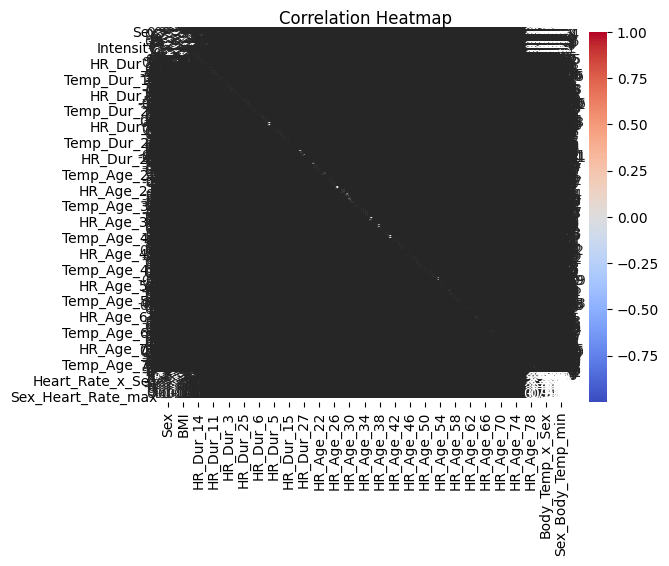

In [ ]:
import seaborn as sns
sns.heatmap(train.corr(numeric_only=True), annot = True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
sns.pairplot(df)
plt.tight_layout()
plt.show()

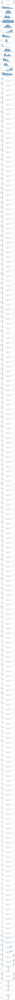

In [ ]:
num_cols = train.select_dtypes(include=[np.number]).columns
fig, axs = plt.subplots(nrows=len(num_cols), ncols=1, figsize=(8, len(num_cols)*2.5))

for i, col in enumerate(num_cols):
    sns.histplot(train[col], bins=30, kde=True, ax=axs[i])
    axs[i].set_title(f'HISTOGRAM_{col}')
    axs[i].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [ ]:
nrows, ncols = 30, 7
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(120, 160), dpi=100)

num_cols = len(train.select_dtypes(include=[np.number]).columns)

for i, col in enumerate(train.select_dtypes(include=[np.number]).columns):
    row = i // ncols
    col_idx = i % ncols
    sns.violinplot(x=train['Sex'], y=train[col], palette='Set2', ax=axs[row, col_idx])
    axs[row, col_idx].set_title(f'Sex vs {col}')
    axs[row, col_idx].grid(axis='y', linestyle='--', alpha=0.7)

# Hide unused subplots
for i in range(num_cols, nrows * ncols):
    row = i // ncols
    col_idx = i % ncols
    axs[row, col_idx].set_visible(False)

plt.tight_layout()
plt.show()


### KMEANS

In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
x_pca = train.drop(['Calories','Sex'], axis = 1)
pca = PCA(n_components=3)
X_pca = pca.fit_transform(x_pca)

In [ ]:
## EXPLAINED VARIANCE AFTER PCA
pca.explained_variance_ratio_.sum()

np.float64(0.8230107485817433)

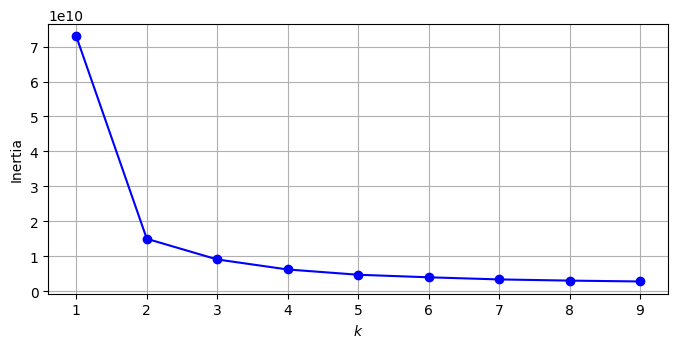

In [ ]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(X_pca)
                for k in range(1, 10)]
inertias = [model.inertia_ for model in kmeans_per_k]

plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 10), inertias, "bo-")
plt.xlabel("$k$")
plt.ylabel("Inertia")
plt.grid()
plt.show()

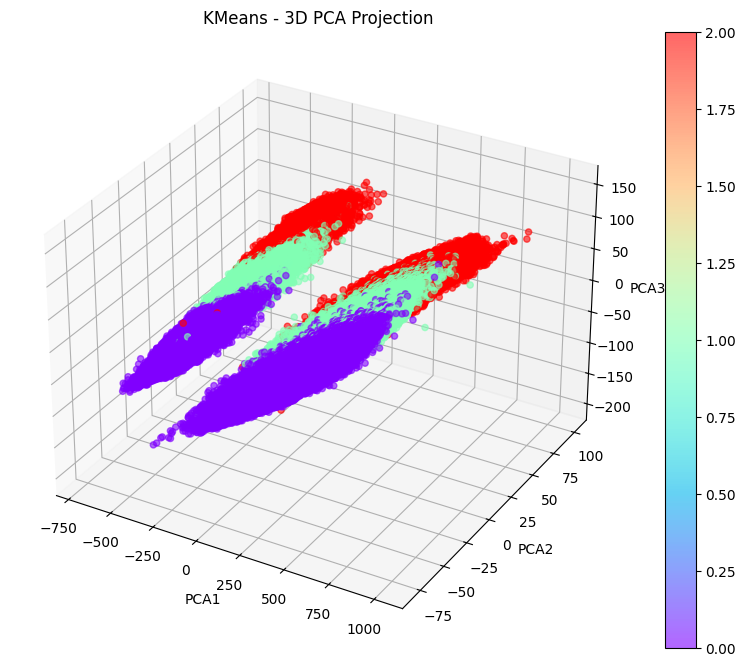

In [ ]:
kmean_model = KMeans(n_clusters= 3, random_state = 42)
kmean_model.fit_predict(X_pca)
df_pca = pd.DataFrame(X_pca, columns=['PCA1','PCA2','PCA3'])
pca_df = pd.concat([df_pca, pd.DataFrame({'cluster': kmean_model.labels_})], axis = 1)

##The 'Calories' feature was divided into tertiles using pd.qcut.
pca_df['group'] = pd.qcut(train['Calories'], q=3, labels=False)

(pca_df['group'] == pca_df['cluster']).mean()


##PLOT #
fig = plt.figure(figsize= (10,8))
ax = fig.add_subplot(111,projection='3d')

scatter = ax.scatter(
    pca_df['PCA1'],
    pca_df['PCA2'],
    pca_df['PCA3'],
    c = pca_df['group'],
    cmap = 'rainbow',
    marker = 'o',
    alpha = 0.6
)

ax.set_title('KMeans - 3D PCA Projection')
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('PCA3')
plt.colorbar(scatter)
plt.show()

# Train

## Align Columns

In [ ]:
# === Align Columns ===
common_cols = [col for col in test.columns if col in train.columns and col != 'Calories']
X = train[common_cols]
y = np.log1p(train['Calories'])
X_test = test[common_cols]

## CatBoost Training (StratifiedKFold on Duration bins)

In [ ]:
# === CatBoost Training (StratifiedKFold on Duration bins) ===
bins = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='quantile')
duration_bins = bins.fit_transform(train[['Duration']]).astype(int).flatten()

cat_params = {
    'iterations': 2500,
    'learning_rate': 0.02,
    'depth': 10,
    'loss_function': 'RMSE',
    'l2_leaf_reg': 3,
    'random_seed': 42,
    'eval_metric': 'RMSE',
    'early_stopping_rounds': 100,
    'cat_features': ['Sex'],
    'verbose': 0,
    'task_type': 'GPU'
}

cat_preds = np.zeros(len(X_test))
cat_oof = np.zeros(len(X))
cat_scores = []
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(skf.split(X, duration_bins)):
    model = CatBoostRegressor(**cat_params)
    model.fit(X.iloc[train_idx], y.iloc[train_idx], eval_set=(X.iloc[val_idx], y.iloc[val_idx]), use_best_model=True)
    cat_oof[val_idx] = model.predict(X.iloc[val_idx])
    cat_preds += model.predict(X_test) / skf.n_splits
    fold_score = np.sqrt(mean_squared_log_error(np.expm1(y.iloc[val_idx]), np.expm1(cat_oof[val_idx])))
    print(f"Fold {fold+1} - CatBoost RMSLE: {fold_score:.5f}")
    cat_scores.append(fold_score)
print(f"\n CatBoost Mean RMSLE: {np.mean(cat_scores):.5f}")

Fold 1 - CatBoost RMSLE: 0.05862
Fold 2 - CatBoost RMSLE: 0.06168
Fold 3 - CatBoost RMSLE: 0.06029
Fold 4 - CatBoost RMSLE: 0.05906
Fold 5 - CatBoost RMSLE: 0.05872
Fold 6 - CatBoost RMSLE: 0.05985
Fold 7 - CatBoost RMSLE: 0.06039
Fold 8 - CatBoost RMSLE: 0.05874
Fold 9 - CatBoost RMSLE: 0.05943
Fold 10 - CatBoost RMSLE: 0.06105

 CatBoost Mean RMSLE: 0.05978


## XGBoost Training (Standard KFold)

In [ ]:
# === XGBoost Training (Standard KFold) ===
X_xgb = X.copy()
X_test_xgb = X_test.copy()
X_xgb['Sex'] = X_xgb['Sex'].astype(int)
X_test_xgb['Sex'] = X_test_xgb['Sex'].astype(int)

kf = KFold(n_splits=10, shuffle=True, random_state=42)
xgb_oof = np.zeros(len(train))
xgb_preds = np.zeros(len(test))
xgb_scores = []

xgb_params = {
    'max_depth': 9,
    'colsample_bytree': 0.7,
    'subsample': 0.9,
    'n_estimators': 3000,
    'learning_rate': 0.01,
    'gamma': 0.01,
    'max_delta_step': 2,
    'eval_metric': 'rmse',
    'enable_categorical': False,
    'random_state': 42,
    'early_stopping_rounds': 200,
    'tree_method': 'gpu_hist'
}

for fold, (train_idx, val_idx) in enumerate(kf.split(X_xgb)):
    model = XGBRegressor(**xgb_params)
    model.fit(X_xgb.iloc[train_idx], y.iloc[train_idx], eval_set=[(X_xgb.iloc[val_idx], y.iloc[val_idx])], verbose=False)
    xgb_oof[val_idx] = model.predict(X_xgb.iloc[val_idx])
    xgb_preds += model.predict(X_test_xgb) / kf.n_splits
    fold_score = np.sqrt(mean_squared_log_error(np.expm1(y.iloc[val_idx]), np.expm1(xgb_oof[val_idx])))
    print(f"Fold {fold+1} - XGBoost RMSLE: {fold_score:.5f}")
    xgb_scores.append(fold_score)
print(f"\n XGBoost Mean RMSLE: {np.mean(xgb_scores):.5f}")

Fold 1 - XGBoost RMSLE: 0.05924
Fold 2 - XGBoost RMSLE: 0.05987
Fold 3 - XGBoost RMSLE: 0.06008
Fold 4 - XGBoost RMSLE: 0.06059
Fold 5 - XGBoost RMSLE: 0.05985
Fold 6 - XGBoost RMSLE: 0.06072
Fold 7 - XGBoost RMSLE: 0.05904
Fold 8 - XGBoost RMSLE: 0.05926
Fold 9 - XGBoost RMSLE: 0.05977
Fold 10 - XGBoost RMSLE: 0.06190

 XGBoost Mean RMSLE: 0.06003


## Final Blend (Weighted Average)

In [ ]:
# === Final Blend (Weighted Average) ===
final_preds = 0.51 * np.expm1(xgb_preds) + 0.49 * np.expm1(cat_preds)
submission['Calories'] = np.clip(final_preds, 1, 314)
submission.to_csv('submission.csv', index=False)
print("\n submission.csv saved ")


 submission.csv saved 


## Diagnostics

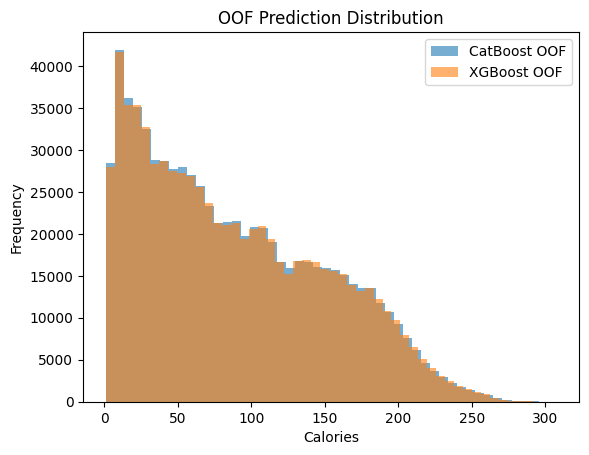


 Final Submission Preview:
                  id       Calories
count  250000.000000  250000.000000
mean   874999.500000      88.162533
std     72168.927986      62.257773
min    750000.000000       1.023331
25%    812499.750000      34.000084
50%    874999.500000      76.423448
75%    937499.250000     135.386233
max    999999.000000     300.444754
       id    Calories
0  750000   27.350689
1  750001  108.253696
2  750002   87.332840
3  750003  125.966945
4  750004   76.128342


In [ ]:
# === Diagnostics ===
plt.hist(np.expm1(cat_oof), bins=50, alpha=0.6, label='CatBoost OOF')
plt.hist(np.expm1(xgb_oof), bins=50, alpha=0.6, label='XGBoost OOF')
plt.title("OOF Prediction Distribution")
plt.xlabel("Calories")
plt.ylabel("Frequency")
plt.legend()
plt.show()

print("\n Final Submission Preview:")
print(submission.describe())
print(submission.head())